<a href="https://colab.research.google.com/github/y-ramakrishna/Facial_Emotion_recognition/blob/main/Facial_Emotion_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import shutil

# Ensure the .kaggle directory exists
os.makedirs("/root/.kaggle", exist_ok=True)

# Move kaggle.json to the correct location
shutil.move("/content/kaggle.json", "/root/.kaggle/kaggle.json")

# Set permissions to avoid permission errors
os.chmod("/root/.kaggle/kaggle.json", 600)

print("✅ Kaggle API setup is complete!")

✅ Kaggle API setup is complete!


In [ ]:
!kaggle datasets list

ref                                                           title                                                     size  lastUpdated                 downloadCount  voteCount  usabilityRating  
------------------------------------------------------------  --------------------------------------------------  ----------  --------------------------  -------------  ---------  ---------------  
atharvasoundankar/chocolate-sales                             Chocolate Sales Data 📊🍫                                  14473  2025-03-19 03:51:40.270000          10533        184  1.0              
abdulmalik1518/mobiles-dataset-2025                           Mobiles Dataset (2025)                                   20314  2025-02-18 06:50:24.370000          16591        283  1.0              
adilshamim8/student-depression-dataset                        Student Depression Dataset                              467020  2025-03-13 03:12:30.423000           3148         57  1.0              
mahmoudelh

In [ ]:
!kaggle competitions download -c challenges-in-representation-learning-facial-expression-recognition-challenge

In [ ]:
!pip install --upgrade --force-reinstall --no-deps kaggle

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 173.2/173.2 kB 10.7 MB/s eta 0:00:00
  Attempting uninstall: kaggle
    Found existing installation: kaggle 1.7.4.2
    Uninstalling kaggle-1.7.4.2:
      Successfully uninstalled kaggle-1.7.4.2


In [ ]:
#if ..only read permisions ..ERROR
!chmod 600 /root/.kaggle/kaggle.json

In [ ]:
# if 403 forbidden ERROR ... then accept the rules in kaggle dataset page

!kaggle competitions download -c challenges-in-representation-learning-facial-expression-recognition-challenge


challenges-in-representation-learning-facial-expression-recognition-challenge.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
!unzip challenges-in-representation-learning-facial-expression-recognition-challenge.zip

Archive:  challenges-in-representation-learning-facial-expression-recognition-challenge.zip
  inflating: example_submission.csv  
  inflating: fer2013.tar.gz          
  inflating: icml_face_data.csv      
  inflating: test.csv                
  inflating: train.csv               


In [ ]:

ls

challenges-in-representation-learning-facial-expression-recognition-challenge.zip  sample_data/
example_submission.csv                                                             test.csv
fer2013.tar.gz                                                                     train.csv
icml_face_data.csv


In [ ]:
!tar -xf fer2013.tar.gz   # x= extract , f= to create archive

In [ ]:

ls

challenges-in-representation-learning-facial-expression-recognition-challenge.zip
example_submission.csv
fer2013/
fer2013.tar.gz
icml_face_data.csv
sample_data/
test.csv
train.csv


In [ ]:

cd fer2013

/content/fer2013


In [ ]:
ls

fer2013.bib  fer2013.csv  README


In [ ]:
""" IMPORT ALL DEPENDENCIES"""


# NumPy for numerical computing
import numpy as np

# Pandas for DataFrames
import pandas as pd

# Matplotlib for visualization
from matplotlib import pyplot as plt
# display plots in the notebook
%matplotlib inline
# import color maps
from matplotlib.colors import ListedColormap

# Seaborn for easier visualization
import seaborn as sns


In [ ]:
import pandas as pd

df = pd.read_csv("/content/fer2013/fer2013.csv")
df.head()

,emotion,pixels,Usage
0,0,70 80 82 72 58 58 60 63 54 58 60 48 89 115 121...,Training
1,0,151 150 147 155 148 133 111 140 170 174 182 15...,Training
2,2,231 212 156 164 174 138 161 173 182 200 106 38...,Training
3,4,24 32 36 30 32 23 19 20 30 41 21 22 32 34 21 1...,Training
4,6,4 0 0 0 0 0 0 0 0 0 0 0 3 15 23 28 48 50 58 84...,Training


In [ ]:
df

,emotion,pixels,Usage
0,0,70 80 82 72 58 58 60 63 54 58 60 48 89 115 121...,Training
1,0,151 150 147 155 148 133 111 140 170 174 182 15...,Training
2,2,231 212 156 164 174 138 161 173 182 200 106 38...,Training
3,4,24 32 36 30 32 23 19 20 30 41 21 22 32 34 21 1...,Training
4,6,4 0 0 0 0 0 0 0 0 0 0 0 3 15 23 28 48 50 58 84...,Training
...,...,...,...
35882,6,50 36 17 22 23 29 33 39 34 37 37 37 39 43 48 5...,PrivateTest
35883,3,178 174 172 173 181 188 191 194 196 199 200 20...,PrivateTest
35884,0,17 17 16 23 28 22 19 17 25 26 20 24 31 19 27 9...,PrivateTest
35885,3,30 28 28 29 31 30 42 68 79 81 77 67 67 71 63 6...,PrivateTest


In [ ]:

df.shape

(35887, 3)

<Axes: xlabel='emotion', ylabel='count'>

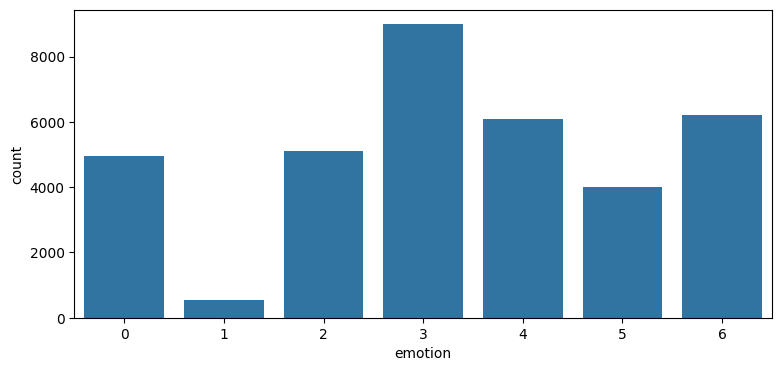

In [ ]:
""" matplotlib => to define size , sns => to use counterplot """

plt.figure(figsize=(9,4))
sns.countplot(x='emotion', data=df)

In [ ]:
df['emotion'].value_counts()

,count
emotion,
3,8989
6,6198
4,6077
2,5121
0,4953
5,4002
1,547


<Axes: xlabel='Usage', ylabel='count'>

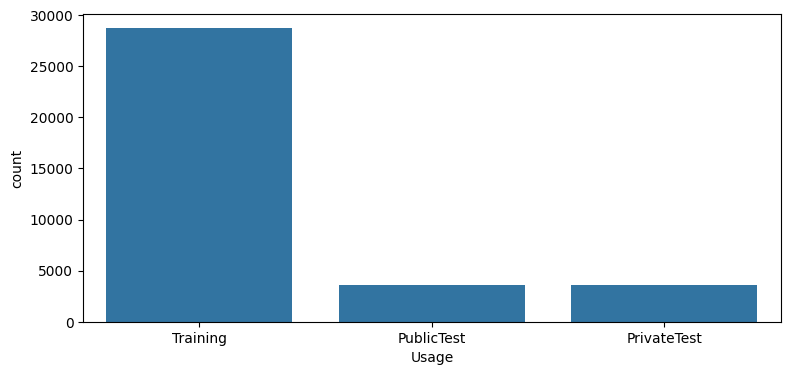

In [ ]:

plt.figure(figsize=(9,4))
sns.countplot(x='Usage', data=df)

In [ ]:

df['Usage'].value_counts()

,count
Usage,
Training,28709
PublicTest,3589
PrivateTest,3589


In [ ]:
import cv2
image_size=(48,48)


pixels = df['pixels'].tolist() # Converting the relevant column element into a list for each row
width, height = 48, 48
faces = []

for pixel_sequence in pixels:
  face = [int(pixel) for pixel in pixel_sequence.split(' ')] # Splitting the string by space character as a list
  face = np.asarray(face).reshape(width, height) #converting the list to numpy array in size of 48*48
  face = cv2.resize(face.astype('uint8'),image_size) #resize the image to have 48 cols (width) and 48 rows (height)
  faces.append(face.astype('float32')) #makes the list of each images of 48*48 and their pixels in numpyarray form

faces = np.asarray(faces) #converting the list into numpy array
faces = np.expand_dims(faces, -1) #Expand the shape of an array -1=last dimension => means color space
emotions = pd.get_dummies(df['emotion']).to_numpy() #doing the one hot encoding type on emotions

In [ ]:
print(faces[0]) #Pixels after preprocessing


[[[ 70.]
  [ 80.]
  [ 82.]
  ...
  [ 52.]
  [ 43.]
  [ 41.]]

 [[ 65.]
  [ 61.]
  [ 58.]
  ...
  [ 56.]
  [ 52.]
  [ 44.]]

 [[ 50.]
  [ 43.]
  [ 54.]
  ...
  [ 49.]
  [ 56.]
  [ 47.]]

 ...

 [[ 91.]
  [ 65.]
  [ 42.]
  ...
  [ 72.]
  [ 56.]
  [ 43.]]

 [[ 77.]
  [ 82.]
  [ 79.]
  ...
  [105.]
  [ 70.]
  [ 46.]]

 [[ 77.]
  [ 72.]
  [ 84.]
  ...
  [106.]
  [109.]
  [ 82.]]]


In [ ]:
print(faces.shape)
print(faces[0].ndim)
print(type(faces))

(35887, 48, 48, 1)
3
<class 'numpy.ndarray'>


In [ ]:

print(emotions[0]) #Emotion after preprocessing

[ True False False False False False False]


In [ ]:

print(emotions.shape)
print(emotions.ndim)
print(type(emotions))

(35887, 7)
2
<class 'numpy.ndarray'>


In [ ]:
x = faces.astype('float32')
x = x / 255.0 #Dividing the pixels by 255 for normalization  => range(0,1)

# Scaling the pixels value in range(-1,1)
x = x - 0.5
x = x * 2.0

In [ ]:
print(x[0])

[[[-0.45098037]
  [-0.372549  ]
  [-0.35686272]
  ...
  [-0.5921569 ]
  [-0.6627451 ]
  [-0.6784314 ]]

 [[-0.49019605]
  [-0.52156866]
  [-0.54509807]
  ...
  [-0.56078434]
  [-0.5921569 ]
  [-0.654902  ]]

 [[-0.60784316]
  [-0.6627451 ]
  [-0.5764706 ]
  ...
  [-0.6156863 ]
  [-0.56078434]
  [-0.6313726 ]]

 ...

 [[-0.2862745 ]
  [-0.49019605]
  [-0.67058825]
  ...
  [-0.4352941 ]
  [-0.56078434]
  [-0.6627451 ]]

 [[-0.3960784 ]
  [-0.35686272]
  [-0.38039213]
  ...
  [-0.17647058]
  [-0.45098037]
  [-0.6392157 ]]

 [[-0.3960784 ]
  [-0.4352941 ]
  [-0.34117645]
  ...
  [-0.16862744]
  [-0.14509803]
  [-0.35686272]]]


In [ ]:

type(x)

numpy.ndarray

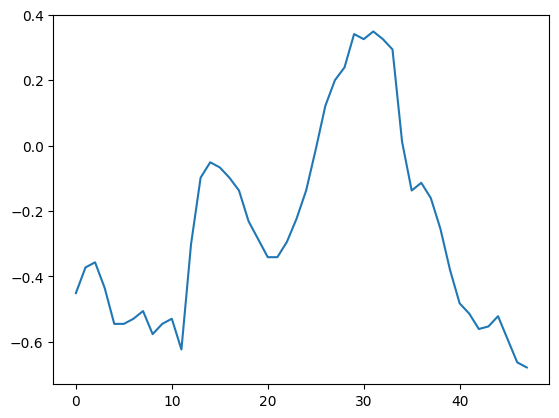

In [ ]:
plt.plot(x[0,0])
plt.show()


In [ ]:
print(x.min(),x.max()) # we can observe that pixels are scale

-1.0 1.0


In [ ]:

num_samples, num_classes = emotions.shape

num_samples = len(x)
num_train_samples = int((1 - 0.2)*num_samples)

# Traning data
train_x = x[:num_train_samples]
train_y = emotions[:num_train_samples]

# Validation data
val_x = x[num_train_samples:]
val_y = emotions[num_train_samples:]

train_data = (train_x, train_y)
val_data = (val_x, val_y)

In [ ]:
print('Training Pixels',train_x.shape)  # ==> 4 dims -  no of images , width , height , color
print('Training labels',train_y.shape)

print('Validation Pixels',val_x.shape)
print('Validation labels',val_y.shape)

Training Pixels (28709, 48, 48, 1)
Training labels (28709, 7)
Validation Pixels (7178, 48, 48, 1)
Validation labels (7178, 7)


In [ ]:
#load the libaray to built the model
from keras.layers import Activation, Convolution2D, Dropout, Conv2D
from keras.layers import AveragePooling2D, BatchNormalization
from keras.layers import GlobalAveragePooling2D
from keras.models import Sequential
from keras.layers import Flatten
from keras.models import Model
from keras.layers import Input
from keras.layers import MaxPooling2D
from keras.layers import SeparableConv2D
from keras import layers
from keras.regularizers import l2


In [ ]:
"""
* keras.__version__
* pip install --upgrade keras
"""

'\n* keras.__version__\n* pip install --upgrade keras\n'

In [ ]:
input_shape=(48, 48, 1)
num_classes = 7

In [ ]:
""" Building up Model Architecture """

model = Sequential()
model.add(Convolution2D(filters=16, kernel_size=(7, 7), padding='same',
                            name='image_array', input_shape=input_shape))
model.add(BatchNormalization())
model.add(Convolution2D(filters=16, kernel_size=(7, 7), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(AveragePooling2D(pool_size=(2, 2), padding='same'))
model.add(Dropout(.5))

model.add(Convolution2D(filters=32, kernel_size=(5, 5), padding='same'))
model.add(BatchNormalization())
model.add(Convolution2D(filters=32, kernel_size=(5, 5), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(AveragePooling2D(pool_size=(2, 2), padding='same'))
model.add(Dropout(.5))

model.add(Convolution2D(filters=64, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Convolution2D(filters=64, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(AveragePooling2D(pool_size=(2, 2), padding='same'))
model.add(Dropout(.5))

model.add(Convolution2D(filters=128, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Convolution2D(filters=128, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(AveragePooling2D(pool_size=(2, 2), padding='same'))
model.add(Dropout(.5))

model.add(Convolution2D(filters=256, kernel_size=(3, 3), padding='same'))
model.add(BatchNormalization())
model.add(Convolution2D(filters=num_classes, kernel_size=(3, 3), padding='same'))
model.add(GlobalAveragePooling2D())
model.add(Activation('softmax',name='predictions'))

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ image_array (Conv2D)                 │ (None, 48, 48, 16)          │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 48, 48, 16)          │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 48, 48, 16)          │          12,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 48, 48, 16)          │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 48, 48, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ average_pooling2d (AveragePooling2D) │ (None, 24, 24, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 24, 24, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 24, 24, 32)          │          12,832 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 24, 24, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 24, 24, 32)          │          25,632 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 24, 24, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 24, 24, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ average_pooling2d_1                  │ (None, 12, 12, 32)          │               0 │
│ (AveragePooling2D)                   │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 12, 12, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 12, 12, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 12, 12, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 12, 12, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 12, 12, 64)          │             256 │
│ (BatchNormalization)                 │                             │              

 Total params: 642,935 (2.45 MB)

 Trainable params: 641,463 (2.45 MB)

 Non-trainable params: 1,472 (5.75 KB)

In [ ]:
# parameters
batch_size = 32 #Number of samples per gradient update
num_epochs = 200 # Number of epochs to train the model.
#input_shape = (64, 64, 1)
verbose = 1 #per epohs  progress bar
num_classes = 7
patience = 50
base_path = 'drive/Colab Notebooks/emotion/simplecnn/'

In [ ]:
from keras.callbacks import CSVLogger, ModelCheckpoint, EarlyStopping
from keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator


In [ ]:
""" Data Augmentation => taking the batch and apply some series of random transformations (random rotation, resizing, shearing)

      ===> to increase generalizability of model  """


# data generator Generate batches of tensor image data with real-time data augmentation
data_generator = ImageDataGenerator(
                        featurewise_center=False,
                        featurewise_std_normalization=False,
                        rotation_range=10,
                        width_shift_range=0.1,
                        height_shift_range=0.1,
                        zoom_range=.1,
                        horizontal_flip=True)

In [ ]:
# model parameters/compilation

""" CONFIGURATION ==>.compile(optimizer, loss , metrics) """



model.compile(optimizer='adam', loss='categorical_crossentropy',
              metrics=['accuracy'])
model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ image_array (Conv2D)                 │ (None, 48, 48, 16)          │             800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 48, 48, 16)          │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 48, 48, 16)          │          12,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 48, 48, 16)          │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 48, 48, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ average_pooling2d (AveragePooling2D) │ (None, 24, 24, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 24, 24, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 24, 24, 32)          │          12,832 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 24, 24, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 24, 24, 32)          │          25,632 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 24, 24, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 24, 24, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ average_pooling2d_1                  │ (None, 12, 12, 32)          │               0 │
│ (AveragePooling2D)                   │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 12, 12, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 12, 12, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 12, 12, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 12, 12, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 12, 12, 64)          │             256 │
│ (BatchNormalization)                 │                             │              

 Total params: 642,935 (2.45 MB)

 Trainable params: 641,463 (2.45 MB)

 Non-trainable params: 1,472 (5.75 KB)

In [ ]:
datasets = ['fer2013']
num_epochs = 30
base_path="/content"
for dataset_name in datasets:
    print('Training dataset:', dataset_name)

    #callbacks
    log_file_path = dataset_name + '_emotion_training.log'

    csv_logger = CSVLogger(log_file_path, append=False)
    early_stop = EarlyStopping('val_loss', patience=patience)
    reduce_lr = ReduceLROnPlateau('val_loss', factor=0.1,patience=int(patience/4), verbose=1)

    trained_models_path = base_path + dataset_name + 'simple_cnn'
    model_names = trained_models_path + '.{epoch:02d}-{val_loss:.2f}.keras'
    model_checkpoint = ModelCheckpoint(model_names, monitor='val_loss', verbose=1, save_best_only=True)
    my_callbacks = [model_checkpoint, csv_logger, early_stop, reduce_lr]

    # loading dataset
    train_faces, train_emotions = train_data
    history = model.fit(
    data_generator.flow(train_faces, train_emotions, batch_size=batch_size),
    epochs=num_epochs,
    verbose=1
)

Training dataset: fer2013
Epoch 1/30


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


898/898 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - accuracy: 0.2451 - loss: 1.8812
Epoch 2/30
898/898 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - accuracy: 0.3352 - loss: 1.6836
Epoch 3/30
898/898 ━━━━━━━━━━━━━━━━━━━━ 20s 19ms/step - accuracy: 0.3615 - loss: 1.6117
Epoch 4/30
898/898 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - accuracy: 0.3871 - loss: 1.5598
Epoch 5/30
898/898 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - accuracy: 0.4175 - loss: 1.5114
Epoch 6/30
898/898 ━━━━━━━━━━━━━━━━━━━━ 18s 19ms/step - accuracy: 0.4228 - loss: 1.4814
Epoch 7/30
898/898 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - accuracy: 0.4392 - loss: 1.4531
Epoch 8/30
898/898 ━━━━━━━━━━━━━━━━━━━━ 17s 19ms/step - accuracy: 0.4534 - loss: 1.4217
Epoch 9/30
898/898 ━━━━━━━━━━━━━━━━━━━━ 18s 19ms/step - accuracy: 0.4609 - loss: 1.4032
Epoch 10/30
898/898 ━━━━━━━━━━━━━━━━━━━━ 20s 19ms/step - accuracy: 0.4682 - loss: 1.3886
Epoch 11/30
898/898 ━━━━━━━━━━━━━━━━━━━━ 17s 19ms/step - accuracy: 0.4694 - loss: 1.3811
Epoch 12/30
898/898 ━━━━━━━━━━━━━━━━━━━━ 

In [ ]:
#evaluate() returns [loss,acc]
score = model.evaluate(val_x, val_y, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1]*100)


225/225 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.5560 - loss: 1.1635
Test loss: 1.1497132778167725
Test accuracy: 55.90693950653076


In [ ]:
""" metrics collected by history object """
history_dict=history.history
history_dict.keys()

dict_keys(['accuracy', 'loss'])

In [ ]:
print(history_dict["accuracy"])

[0.26995018124580383, 0.34128671884536743, 0.3671322464942932, 0.39238566160202026, 0.4175693988800049, 0.4298303723335266, 0.4401407241821289, 0.45337697863578796, 0.4583580195903778, 0.4666132628917694, 0.47065380215644836, 0.4790135622024536, 0.4849698841571808, 0.49144867062568665, 0.49224981665611267, 0.48810476064682007, 0.4973701536655426, 0.4977881610393524, 0.5028388500213623, 0.502734363079071, 0.5013062357902527, 0.5056254267692566, 0.5052422881126404, 0.505973756313324, 0.5130098462104797, 0.5077850222587585, 0.5127311944961548, 0.5177470445632935, 0.516876220703125, 0.514577329158783]


In [ ]:
emotion_dict = {0: "Neutral", 1: "Disgusted", 2: "Fearful", 3: "Happy", 4: "Sad", 5: "Surprised", 6: "Neutral"}

#emojis unicodes #
emojis = {0: "\U0001f620", 1: "\U0001f922", 2: "\U0001f628", 3: "\U0001f60A", 4: "\U0001f625", 5: "\U0001f632", 6: "\U0001f610"} #Removed the extra space before this line

In [ ]:
print(emojis.values(),sep=" ")

dict_values(['😠', '🤢', '😨', '😊', '😥', '😲', '😐'])


In [ ]:
!cd content
!pwd
!ls

/bin/bash: line 1: cd: content: No such file or directory
/content/fer2013
fer2013.bib  fer2013.csv  README


In [ ]:
!cd content

/bin/bash: line 1: cd: content: No such file or directory


In [ ]:
%cd /content/
!mv /content/images/IMG_0149.JPG /content/

/content


In [ ]:
facecasc = cv2.CascadeClassifier('/content/haarcascade_frontalface_default.xml')
imagePath = "/content/IMG_0149.JPG"

In [ ]:
!ls /content/

challenges-in-representation-learning-facial-expression-recognition-challenge.zip  IMG_0149.JPG
example_submission.csv								   model.h5
fer2013										   sample_data
fer2013.tar.gz									   test.csv
icml_face_data.csv								   train.csv
images


In [ ]:
import cv2

facecasc = cv2.CascadeClassifier('/content/haarcascade_frontalface_default.xml')

if facecasc.empty():
    print("Error: Haar cascade file not loaded correctly!")
else:
    print("Haar cascade loaded successfully!")

Error: Haar cascade file not loaded correctly!


In [ ]:
!ls /content/

challenges-in-representation-learning-facial-expression-recognition-challenge.zip  IMG_0149.JPG
example_submission.csv								   model.h5
fer2013										   sample_data
fer2013.tar.gz									   test.csv
icml_face_data.csv								   train.csv
images


In [ ]:
from google.colab.patches import cv2_imshow
import cv2

def _predict(path):
  facecasc = cv2.CascadeClassifier('/content/haarcascade_frontalface_default.xml')
  imagePath = '/content/'+path
  image = cv2.imread(imagePath)
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  faces = facecasc.detectMultiScale(gray,scaleFactor=1.3, minNeighbors=10)
  print("No of faces : ",len(faces))
  i = 1
  for (x, y, w, h) in faces:
    cv2.rectangle(image, (x, y), (x+w, y+h), (0, 255, 0), 2)
    roi_gray = gray[y:y + h, x:x + w]                      #croping
    cropped_img = np.expand_dims(np.expand_dims(cv2.resize(roi_gray, (48, 48)), -1), 0)
    prediction = model.predict(cropped_img)

    maxindex = int(np.argmax(prediction))
    print("person ",i," : ",emotion_dict[maxindex], "-->",emojis[maxindex])
    cv2.putText(image, emotion_dict[maxindex], (x+10, y-20), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
                                              #if text is not apeared , change coordinates. it may work

  cv2_imshow(image)


In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow  # Required for displaying images in Colab

def _predict(path):
    # Load Haar cascade
    cascade_path = "/content/haarcascade_frontalface_default.xml"
    facecasc = cv2.CascadeClassifier(cascade_path)

    # Check if Haar cascade is loaded correctly
    if facecasc.empty():
        print(" Error: Haar cascade file not loaded correctly!")
        return

    # Load image
    imagePath = "/content/" + path
    image = cv2.imread(imagePath)

    # Check if image is loaded properly
    if image is None:
        print(f"Error: Cannot load image at {imagePath}")
        return

    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Debugging: Check image dimensions
    print(f"Image Loaded Successfully! Shape: {gray.shape}")

    # Detect faces with adjusted parameters
    faces = facecasc.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

    if len(faces) == 0:
        print("No faces detected!")
        return

    print(f"Faces Detected: {len(faces)}")

    # Draw rectangles around detected faces
    for (x, y, w, h) in faces:
        cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

    # Show the image with detected faces
    cv2_imshow(image)

# Run prediction
_predict("IMG_0149.JPG")

❌ Error: Haar cascade file not loaded correctly!


In [ ]:
!ls /content/

challenges-in-representation-learning-facial-expression-recognition-challenge.zip  images
example_submission.csv								   IMG_0149.JPG
fer2013										   model.h5
fer2013.tar.gz									   sample_data
haarcascade_frontalface_alt2.xml						   test.csv
icml_face_data.csv								   train.csv


In [ ]:
!pip install --upgrade opencv-python opencv-python-headless

In [ ]:
import cv2

# Load Haar cascade
cascade_path = "/content/haarcascade_frontalface_default.xml"
facecasc = cv2.CascadeClassifier(cascade_path)

# Check if Haar cascade loaded correctly
if facecasc.empty():
    print("Error: Haar cascade file not loaded correctly!")
else:
    print("Haar cascade loaded successfully!")

❌ Error: Haar cascade file not loaded correctly!


In [ ]:
!wget https://github.com/opencv/opencv/raw/master/data/haarcascades/haarcascade_frontalface_default.xml -P /content/

--2025-03-24 18:01:17--  https://github.com/opencv/opencv/raw/master/data/haarcascades/haarcascade_frontalface_default.xml
Resolving github.com (github.com)... 140.82.121.3
Connecting to github.com (github.com)|140.82.121.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml [following]
--2025-03-24 18:01:18--  https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 930127 (908K) [text/plain]
Saving to: ‘/content/haarcascade_frontalface_default.xml’

haarcascade_frontal 100%[===================>] 908.33K  --.-KB/s    in 0.02s

In [ ]:
import cv2

# Load Haar cascade with correct path
cascade_path = "/content/haarcascade_frontalface_default.xml"
facecasc = cv2.CascadeClassifier(cascade_path)

# Verify if the cascade file is loaded correctly
if facecasc.empty():
    print("Error: Haar cascade file not loaded correctly!")
else:
    print("Haar cascade loaded successfully!")

✅ Haar cascade loaded successfully!


In [ ]:
!find /content/ -name "model.h5"

/content/model.h5


In [ ]:
from google.colab import files
uploaded = files.upload()  # Select model.h5 from your computer

Saving model.h5 to model (1).h5


In [ ]:
!mv /content/model.h5 /content/

mv: '/content/model.h5' and '/content/model.h5' are the same file


✅ Faces Detected: 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


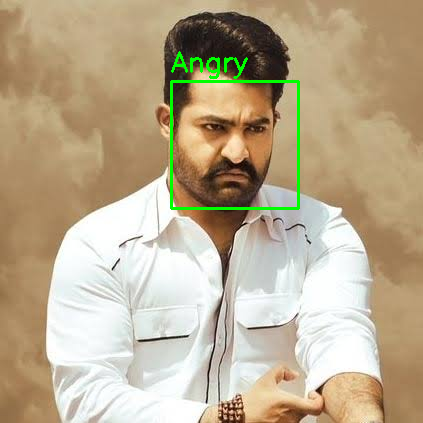

In [ ]:
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from google.colab.patches import cv2_imshow  # For displaying images in Colab

# Load the trained model
model = load_model('/content/model.h5')

# Emotion labels based on your dataset
emotion_labels = ["Angry", "Disgust", "Fear", "Happy", "Neutral", "Sad", "Surprise"]

def _predict(path):
    # Load Haar cascade for face detection
    facecasc = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_default.xml")

    # Load and verify image
    imagePath = "/content/" + path
    image = cv2.imread(imagePath)
    if image is None:
        print(f"Error: Cannot load image at {imagePath}")
        return

    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Detect faces
    faces = facecasc.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

    if len(faces) == 0:
        print("No faces detected!")
        return

    print(f"Faces Detected: {len(faces)}")

    for (x, y, w, h) in faces:
        # Draw rectangle around detected face
        cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

        # Extract the face region
        roi_gray = gray[y:y + h, x:x + w]

        # Preprocess the face for emotion recognition
        cropped_img = cv2.resize(roi_gray, (48, 48))  # Resize to match model input
        cropped_img = np.expand_dims(cropped_img, axis=0)  # Add batch dimension
        cropped_img = np.expand_dims(cropped_img, axis=-1)  # Add channel dimension
        cropped_img = cropped_img / 255.0  # Normalize pixel values

        # Predict the emotion
        predictions = model.predict(cropped_img)
        max_index = int(np.argmax(predictions))  # Get index of highest probability
        predicted_emotion = emotion_labels[max_index]

        # Display emotion label on the image
        cv2.putText(image, predicted_emotion, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

    # Show the final image with face and emotion label
    cv2_imshow(image)

# Run prediction with emotion detection
_predict("IMG_0149.JPG")

In [ ]:
!mv /content/images/IMG_9980.png /content/

✅ Faces Detected (After Filtering): 2
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 696ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


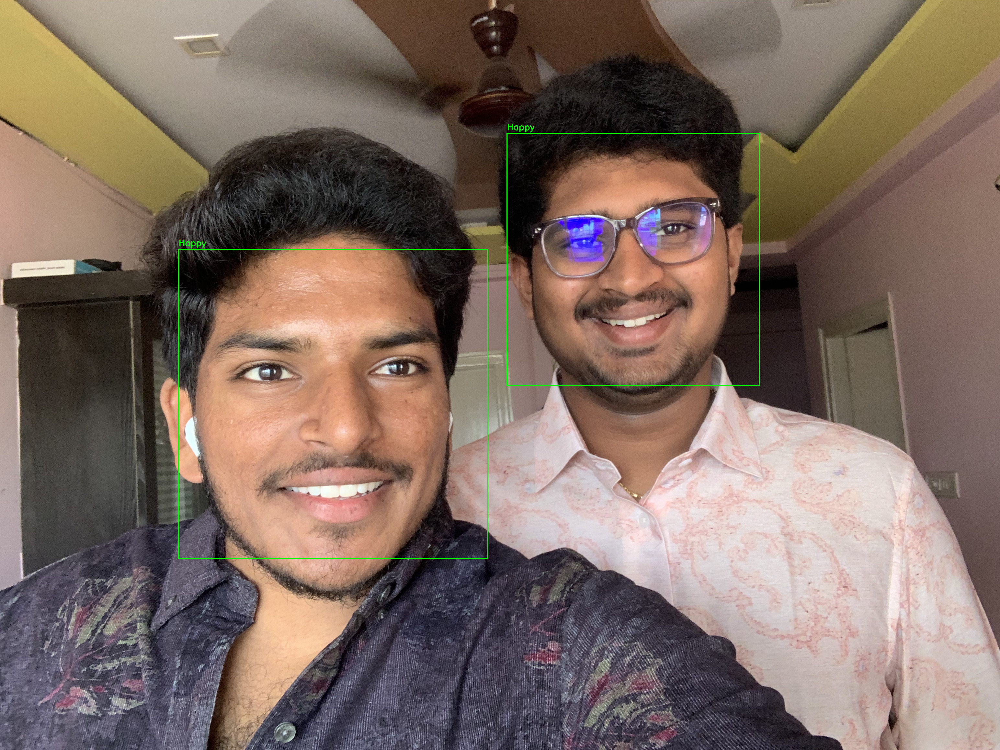

In [ ]:
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from google.colab.patches import cv2_imshow

# Load the trained model
model = load_model('/content/model.h5')

# Emotion labels based on dataset
emotion_labels = ["Angry", "Disgust", "Fear", "Happy", "Neutral", "Sad", "Surprise"]

def _predict(path):
    # Load Haar cascade
    facecasc = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_default.xml")

    # Load and verify image
    imagePath = "/content/" + path
    image = cv2.imread(imagePath)
    if image is None:
        print(f"Error: Cannot load image at {imagePath}")
        return

    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Detect faces with optimized settings
    faces = facecasc.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=8, minSize=(50, 50))

    # Filter out small false detections
    filtered_faces = [f for f in faces if f[2] > 60 and f[3] > 60]

    print(f"Faces Detected (After Filtering): {len(filtered_faces)}")

    if len(filtered_faces) == 0:
        print("No faces detected after filtering!")
        return

    for (x, y, w, h) in filtered_faces:
        # Draw rectangle around detected face
        cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

        # Extract the face region
        roi_gray = gray[y:y + h, x:x + w]

        # Preprocess face for emotion recognition
        cropped_img = cv2.resize(roi_gray, (48, 48))
        cropped_img = np.expand_dims(cropped_img, axis=0)
        cropped_img = np.expand_dims(cropped_img, axis=-1)
        cropped_img = cropped_img / 255.0

        # Predict the emotion
        predictions = model.predict(cropped_img)
        max_index = int(np.argmax(predictions))
        predicted_emotion = emotion_labels[max_index]

        # Display emotion label on the image
        cv2.putText(image, predicted_emotion, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

    # Show the final image with face and emotion label
    cv2_imshow(image)

# Run with the updated detection settings
_predict("IMG_9980.jpg")

✅ Faces Detected (After Filtering): 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


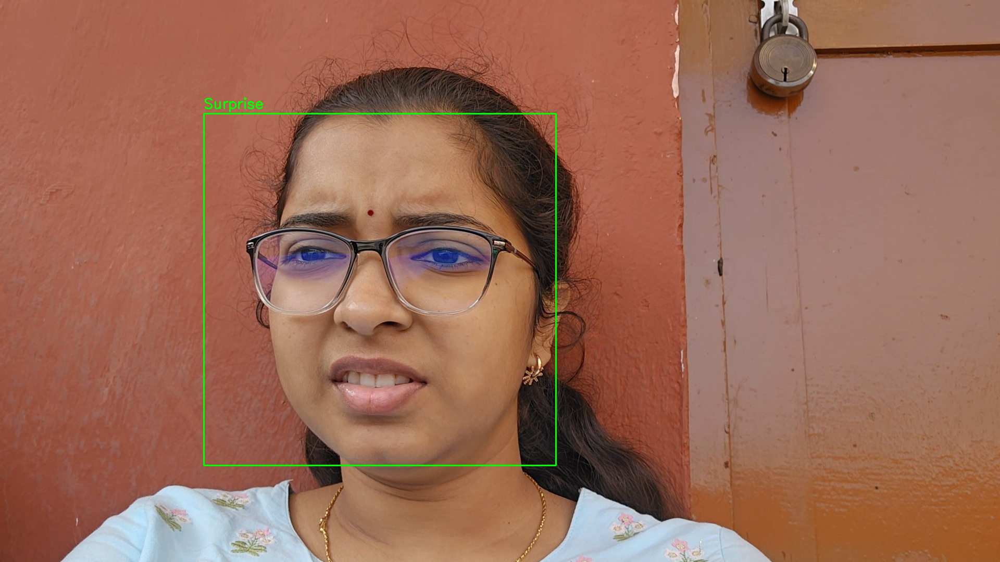

In [ ]:
_predict("sample_3.jpg")

✅ Faces Detected: 3
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
🔍 Raw Prediction Probabilities: [[7.8248361e-04 1.2960839e-04 8.6053339e-04 9.9029934e-01 1.0934931e-03
  1.1176337e-03 5.7168454e-03]]
🧠 Predicted Emotion: Happy (Confidence: 0.99)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
🔍 Raw Prediction Probabilities: [[4.0889755e-03 7.2623778e-04 4.1596941e-03 9.5645005e-01 3.4841313e-03
  6.8888403e-03 2.4202045e-02]]
🧠 Predicted Emotion: Happy (Confidence: 0.96)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
🔍 Raw Prediction Probabilities: [[1.9681386e-03 1.0416094e-04 1.1041199e-03 9.7890669e-01 1.0099907e-03
  1.7580581e-03 1.5148885e-02]]
🧠 Predicted Emotion: Happy (Confidence: 0.98)


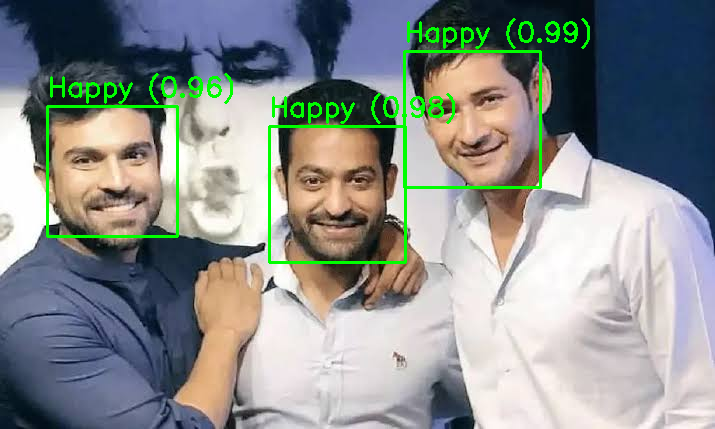

In [ ]:
_predict("IMG_0154.JPG")